### DATA COLLECTION
Dataset: https://www.kaggle.com/shadabhussain/flickr8k

This dataset contains 8000 images each with 5 captions.

In [4]:
!unzip '/content/flickr8k.zip'

Streaming output truncated to the last 5000 lines.
  inflating: flickr_data/Flickr_Data/Images/2845845721_d0bc113ff7.jpg  
  inflating: flickr_data/Flickr_Data/Images/2846037553_1a1de50709.jpg  
  inflating: flickr_data/Flickr_Data/Images/2846785268_904c5fcf9f.jpg  
  inflating: flickr_data/Flickr_Data/Images/2846843520_b0e6211478.jpg  
  inflating: flickr_data/Flickr_Data/Images/2847514745_9a35493023.jpg  
  inflating: flickr_data/Flickr_Data/Images/2847615962_c330bded6e.jpg  
  inflating: flickr_data/Flickr_Data/Images/2847859796_4d9cb0d31f.jpg  
  inflating: flickr_data/Flickr_Data/Images/2848266893_9693c66275.jpg  
  inflating: flickr_data/Flickr_Data/Images/2848571082_26454cb981.jpg  
  inflating: flickr_data/Flickr_Data/Images/2848895544_6d06210e9d.jpg  
  inflating: flickr_data/Flickr_Data/Images/2848977044_446a31d86e.jpg  
  inflating: flickr_data/Flickr_Data/Images/2849194983_2968c72832.jpg  
  inflating: flickr_data/Flickr_Data/Images/2850719435_221f15e951.jpg  
  inflating: 

In [ ]:
!kaggle datasets download -d shadabhussain/flickr8k

### IMPORTING NECESSARY LIBRARIES

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
import re
import cv2
import time
import json
from keras.models import Model , Sequential , load_model
from keras.layers import *
from keras.preprocessing import image
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.utils import plot_model
from keras.applications.resnet50 import ResNet50 , preprocess_input , decode_predictions

### UNDERSTANDING THE DATA

In [4]:
def readTextFile(file_path):
    with open(file_path) as f:
     return f.read()
doc = readTextFile('Flickr_Data/Flickr_Data/Flickr_TextData/Flickr8k.token.txt')
lines = doc.split("\n")[:-1]    # since last line is an empty string
print(len(lines))

40460


In [5]:
descriptions = {}

for line in lines:

    tokens = line.split('\t')

    # take the first token as image id, the rest as caption
    img_name , caption = tokens[0] , tokens[1]
    img_name = img_name.split('.')[0]

    # if image id is not present in dictionary then initialize it with empty list
    if descriptions.get(img_name) is None:
        descriptions[img_name] = []

    descriptions[img_name].append(caption)

In [5]:
descriptions['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

### VISUALIZATION

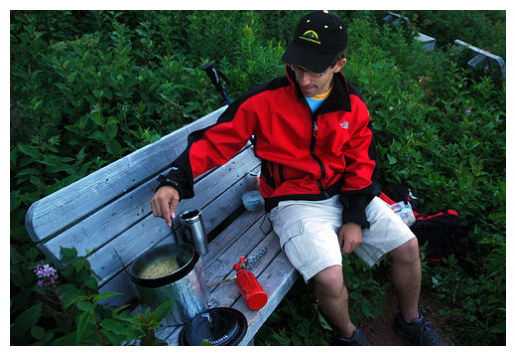

['A man in a red jacket is sitting on a bench whilst cooking a meal .',
 'A man is sitting on a bench , cooking some food .',
 'A man sits on a bench .',
 'A man wearing a red jacket is sitting on a wooden bench and is cooking something in a small pot .',
 'a man wearing a red jacket sitting on a bench next to various camping items']

In [5]:
img_path = "Flickr_Data/Flickr_Data/Images/"
img = cv2.imread(img_path+'35506150_cbdb630f4f'+'.jpg')
img = cv2.cvtColor(img , cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off')
plt.show()
descriptions['35506150_cbdb630f4f']

### DATA CLEANING

In [6]:
def clean_text(sentence):

    # convert to lower case
    sentence = sentence.lower()

    # remove punctuation and numbers from each token
    sentence = re.sub('[^a-z]+' , ' ' , sentence)

    # remove single characters like 's' and 'a'
    sentence = [word for word in sentence.split() if len(word)>1]
    sentence = " ".join(sentence)

    return sentence


for img_id , caption_list in descriptions.items():
    for caption in range(len(caption_list)):
        caption_list[caption] = clean_text(caption_list[caption])

descriptions["1000268201_693b08cb0e"]

['child in pink dress is climbing up set of stairs in an entry way',
 'girl going into wooden building',
 'little girl climbing into wooden playhouse',
 'little girl climbing the stairs to her playhouse',
 'little girl in pink dress going into wooden cabin']

save captions and load it

In [7]:
with open("descriptions0.txt" , "w") as f:
    f.write(str(descriptions))

In [6]:
with open("descriptions0.txt" , "r") as f:
    descriptions = f.read()

type(descriptions)

str

In [7]:
json_acceptable_str = descriptions.replace("'" , "\"")

# loads() method is used to parse a valid JSON string and convert it into a Python Dictionary
descriptions = json.loads(json_acceptable_str)
type(descriptions)

dict

### CREATE VOCAB


In [8]:
total_words = []

for key, caption_list in descriptions.items():
    [total_words.append(word) for caption in caption_list for word in caption.split()]

print("Total no of words across all image captions: %d" %(len(total_words)))

Total no of words across all image captions: 373837


In [11]:
total_words[:9]

['child', 'in', 'pink', 'dress', 'is', 'climbing', 'up', 'set', 'of']

In [9]:
unique_words = set()

for key in descriptions.keys():
    [unique_words.update(caption.split()) for caption in descriptions[key]]

print("Total no of unique words across all image captions: %d" %(len(unique_words)))

Total no of unique words across all image captions: 8424


In [10]:
# Consider only words which occur at least 10 times in the corpus

word_count_threshold = 10
freq_counts = {}

for word in total_words:
    freq_counts[word] = freq_counts.get(word , 0) + 1

print(len(freq_counts.keys()))

8424


In [11]:
# Sort the dictionary according to the frequency count
sorted_freq_count = sorted(freq_counts.items() , reverse = True , key = lambda x:x[1])

In [12]:
print(sorted_freq_count[:10])

[('in', 18987), ('the', 18420), ('on', 10746), ('is', 9345), ('and', 8863), ('dog', 8138), ('with', 7765), ('man', 7275), ('of', 6723), ('two', 5643)]


In [13]:
sorted_freq_count = [x for x in sorted_freq_count if x[1] > word_count_threshold]

vocabulary = [x[0] for x in sorted_freq_count]
print("Final Vocab Size: %d" %len(vocabulary))

Final Vocab Size: 1845


### PREPARE THE TRAIN AND TEST DATA

In [14]:
train_file_data = readTextFile("Flickr_Data/Flickr_Data/Flickr_TextData/Flickr_8k.trainImages.txt")
test_file_data = readTextFile("Flickr_Data/Flickr_Data/Flickr_TextData/Flickr_8k.testImages.txt")
val_file_data = readTextFile("Flickr_Data/Flickr_Data/Flickr_TextData/Flickr_8k.devImages.txt")

In [15]:
train_id = [id.split(".")[0] for id in train_file_data.split("\n")[:-1]]
print("No of Image Id's in Train Data: %d" %len(train_id))
test_id = [id.split(".")[0] for id in test_file_data.split("\n")[:-1]]
print("No of Image Id's in Test Data: %d" %len(test_id))
val_id = [id.split(".")[0] for id in val_file_data.split("\n")[:-1]]
print("No of Image Id's in Train Data: %d" %len(val_id))


No of Image Id's in Train Data: 6000
No of Image Id's in Test Data: 1000
No of Image Id's in Train Data: 1000


In [16]:
# Prepare descriptions for the training data
# Tweak - Add 'start' and 'end' token to our training data
train_descriptions = {}

for img_id in train_id:
    train_descriptions[img_id] = []

    for caption in descriptions[img_id]:
        caption_to_append = "startseq "+caption+" endseq"
        train_descriptions[img_id].append(caption_to_append)

print("Train Descriptions: %d" %len(train_descriptions))

Train Descriptions: 6000


In [17]:
train_descriptions = {}

for img_id in train_id:
    train_descriptions[img_id] = descriptions.get(img_id)

for key , caption_list in train_descriptions.items():
    for caption in range(len(caption_list)):
        caption_list[caption] = 'startseq ' + caption_list[caption] + ' endseq'

In [18]:
# Prepare descriptions for the training data
# Tweak - Add 'start' and 'end' token to our training data
val_descriptions = {}

for img_id in val_id:
    val_descriptions[img_id] = []

    for caption in descriptions[img_id]:
        caption_to_append = "startseq "+caption+" endseq"
        val_descriptions[img_id].append(caption_to_append)

print("val Descriptions: %d" %len(val_descriptions))

val Descriptions: 1000


In [19]:
val_descriptions = {}

for img_id in val_id:
    val_descriptions[img_id] = descriptions.get(img_id)

for key , caption_list in val_descriptions.items():
    for caption in range(len(caption_list)):
        caption_list[caption] = 'startseq ' + caption_list[caption] + ' endseq'


In [20]:
train_descriptions['1000268201_693b08cb0e']

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq']

### IMAGE PREPROCESSING - Image Features Extraction using Transfer Learning (ResNet-50 Model)

In [33]:
model = ResNet50(weights = 'imagenet' , input_shape = (224, 224, 3))
model.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 25,636,712 (97.80 MB)

 Trainable params: 25,583,592 (97.59 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [34]:
model_new = Model(model.input , model.layers[-2].output)
model_new.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [23]:
def preprocess_image(img):
    img = image.load_img(img , target_size = (224, 224))
    img = image.img_to_array(img)

    # Converted from 3D to a 4D tensor i.e from (224, 224, 3) -- axis=0 --> (1, 224, 224, 3)
    img = np.expand_dims(img , axis = 0)

    # Images are converted from RGB to BGR
    # then each color channel is zero-centered with respect to the ImageNet dataset, without scaling
    img = preprocess_input(img)
    return img

In [80]:
img_path="Flickr_Data/Flickr_Data/Images/"

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4850196..0.5923961].


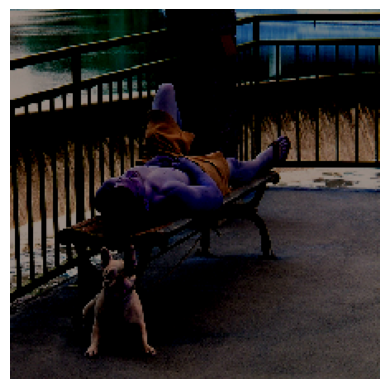

In [23]:
im = preprocess_image(img_path+"1003163366_44323f5815.jpg")
plt.imshow(im[0]/255.0)
plt.axis('off')
plt.show()

In [32]:
def encode_image(img):
    img = preprocess_image(img)
    feature_vector = model_new.predict(img)           # (1 X 2048)
    feature_vector = feature_vector.reshape((-1, ))
    #print(feature_vector.shape)
    return feature_vector

In [33]:
encode_image(img_path+"1003163366_44323f5815.jpg")

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


array([-0.26271182, -0.14933267,  0.95885426, ..., -0.25487816,
       -0.20165454, -0.2720251 ], dtype=float32)

In [35]:
encoded_train_data = {}

for ix, img_id in enumerate(train_id):
    img_path = IMG_PATH + img_id + ".jpg"
    encoded_train_data[img_id] = encode_image(img_path)

    if ix%500 == 0:
        print("Encoding in Progress Step Time %d" %ix)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
Encoding in Progress Step Time 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 601ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━

In [36]:
encoded_val_data = {}

for ix, img_id in enumerate(val_id):
    img_path = IMG_PATH + img_id + ".jpg"
    encoded_val_data[img_id] = encode_image(img_path)

    if ix%500 == 0:
        print("Encoding in Progress Step Time %d" %ix)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
Encoding in Progress Step Time 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━

save features and load as pkl file


In [21]:
with open("encoded_train_img_features.pkl" , "rb") as f:
    encoded_train_data = pickle.load(f)

In [22]:
with open("encoded_val_img_features.pkl" , "rb") as f:
    encoded_val_data = pickle.load(f)

In [23]:
with open("encoded_test_img_features.pkl" , "rb") as f:
    encoded_test_data = pickle.load(f)

### PREPROCESSING CAPTIONS
- We must note that captions are something that we want to predict. So during the training period, captions will be the target variables (Y) that the model is learning to predict.
- But the prediction of the entire caption, given the image does not happen at once. We will predict the caption word by word. Thus, we need to encode each word into a fixed sized vector.

In [24]:
word_to_idx = {}
idx_to_word = {}

for i, word in enumerate(vocabulary):
    word_to_idx[word] = i+1
    idx_to_word[i+1] = word

In [27]:
print(word_to_idx['dog'])
print(idx_to_word[3])

6
on


In [25]:
word_to_idx['startseq'] = 1846
idx_to_word[1846] = 'startseq'

word_to_idx['endseq'] = 1847
idx_to_word[1847] = 'endseq'


# vocab size is len+1 because we will append 0's as well  ;  0th index will be reserved for zero padding
vocab_size = len(word_to_idx) + 1
print("Final Vocab Size: %d" %vocab_size)

Final Vocab Size: 1848


In [26]:
max_len = 0

for key in descriptions.keys():
    for caption in descriptions[key]:
        max_len = max(max_len , len(caption.split()))

print('Max Description Length: %d' %max_len)

Max Description Length: 35


### CUSTOM DATA GENERATOR TO LOAD DATA IN BATCHES

In [27]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical

def data_generator(train_descriptions, encoded_train_data, word_to_idx, max_len, batch_size,vocab_size):
    x1, x2, y = [], [], []
    n = 0

    while True:
        for key, caption_list in train_descriptions.items():
            photo = encoded_train_data[key]

            for caption in caption_list:
                seq = [word_to_idx.get(word, 0) for word in caption.split()]

                for i in range(1, len(seq)):
                    input_seq, output_seq = seq[:i], seq[i]
                    input_seq = pad_sequences([input_seq], maxlen=max_len, value=0, padding='post')[0]
                    output_seq = to_categorical([output_seq], num_classes=vocab_size)[0]
                    x1.append(photo)      # 2048 بعد
                    x2.append(input_seq)  # max_len بعد
                    y.append(output_seq)  # بردار one hot با اندازه vocab_size

            if n == batch_size:
                yield (tf.convert_to_tensor(x1), tf.convert_to_tensor(x2)), tf.convert_to_tensor(y)
                x1, x2, y = [], [], []
                n = 0
            else:
                n += 1



### WORD EMBEDDINGS [Transfer Learning]
Map the every word (index) to a 50-long vector and for this purpose, we will use a pre-trained GLOVE Model:

In [ ]:
!kaggle datasets download -d rtatman/glove-global-vectors-for-word-representation

In [31]:
! unzip '/content/glove-global-vectors-for-word-representation.zip'

'unzip' is not recognized as an internal or external command,
operable program or batch file.


In [28]:
file = open("glove.6B.50d.txt" , encoding = "utf8")

In [29]:
for line in file:
    print(line)
    break

the 0.418 0.24968 -0.41242 0.1217 0.34527 -0.044457 -0.49688 -0.17862 -0.00066023 -0.6566 0.27843 -0.14767 -0.55677 0.14658 -0.0095095 0.011658 0.10204 -0.12792 -0.8443 -0.12181 -0.016801 -0.33279 -0.1552 -0.23131 -0.19181 -1.8823 -0.76746 0.099051 -0.42125 -0.19526 4.0071 -0.18594 -0.52287 -0.31681 0.00059213 0.0074449 0.17778 -0.15897 0.012041 -0.054223 -0.29871 -0.15749 -0.34758 -0.045637 -0.44251 0.18785 0.0027849 -0.18411 -0.11514 -0.78581



In [30]:
embeddings_index = {}   # embeddings for 6 billion words

for line in file:
    values = line.split()
    word = values[0]
    word_embedding = np.array(values[1:] , dtype = 'float')
    embeddings_index[word] = word_embedding

file.close()

In [31]:
def get_embedding_matrix():
    emb_dim = 50
    embedding_matrix = np.zeros((vocab_size , emb_dim))

    for idx, word in idx_to_word.items():
        embedding_vector = embeddings_index.get(word)

        if embedding_vector is not None:
            embedding_matrix[idx] = embedding_vector

    return embedding_matrix

In [32]:
embeddings_matrix = get_embedding_matrix()
embeddings_matrix.shape

(1848, 50)

### DEFINE MODEL ARCHITECTURE

bidirection lstm

In [38]:
# Print layer details to find the Embedding layer
for i, layer in enumerate(model.layers):
    print(i, layer.name, layer.__class__.__name__)


0 input_layer_1 InputLayer
1 embedding Embedding
2 input_layer InputLayer
3 dropout_1 Dropout
4 dropout Dropout
5 lstm LSTM
6 dense Dense
7 attention Attention
8 add Add
9 dense_4 Dense
10 dense_5 Dense


LSTM

In [58]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dropout, Dense, Embedding, LSTM, add, Concatenate
from tensorflow.keras.models import Model

# image feature extractor model
input_img_features = Input(shape=(2048,))
fe1 = Dropout(0.3)(input_img_features)
fe2 = Dense(128, activation='relu')(fe1)  # Reduced to 64-dim features

# partial caption sequence model
input_captions = Input(shape=(max_len,))
se1 = Embedding(vocab_size, 50, mask_zero=True)(input_captions)
se2 = Dropout(0.3)(se1)
se3 = LSTM(128, return_sequences=True)(se2)

# Attention layer
class Attention(tf.keras.layers.Layer):
    def __init__(self, units):
        super(Attention, self).__init__()
        self.W1 = Dense(units)
        self.W2 = Dense(units)
        self.V = Dense(1)

    def call(self, features, hidden):
        # Expand hidden state to match the shape of features
        hidden_with_time_axis = tf.expand_dims(hidden, 1)

        # Score calculation
        score = tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis))

        # Attention weights
        attention_weights = tf.nn.softmax(self.V(score), axis=1)

        # Apply attention weights to the features
        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)

        return context_vector, attention_weights

# Apply attention to image features and LSTM hidden states
attention = Attention(128)
context_vector, attention_weights = attention(fe2, se3[:, -1, :])  # Focus on the last LSTM output

# decoder (feed forward) model - combining image and text features
decoder_input = add([context_vector, se3[:, -1, :]])  # Combining attention and text
decoder2 = Dense(128, activation='relu')(decoder_input)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

# Merge the two input models - image features and encoded text captions
model = Model(inputs=[input_img_features, input_captions], outputs=outputs)


In [37]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dropout, Dense, Embedding, GRU, add, Concatenate
from tensorflow.keras.models import Model

# image feature extractor model
input_img_features = Input(shape=(2048,))
fe1 = Dropout(0.3)(input_img_features)
fe2 = Dense(128, activation='relu')(fe1)  # Reduced to 64-dim features

# partial caption sequence model
input_captions = Input(shape=(max_len,))
se1 = Embedding(vocab_size, 50, mask_zero=True)(input_captions)
se2 = Dropout(0.3)(se1)
se3 = GRU(128, return_sequences=True)(se2)  # GRU instead of LSTM

# Attention layer
class Attention(tf.keras.layers.Layer):
    def __init__(self, units):
        super(Attention, self).__init__()
        self.W1 = Dense(units)
        self.W2 = Dense(units)
        self.V = Dense(1)

    def call(self, features, hidden):
        # Expand hidden state to match the shape of features
        hidden_with_time_axis = tf.expand_dims(hidden, 1)

        # Score calculation
        score = tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis))

        # Attention weights
        attention_weights = tf.nn.softmax(self.V(score), axis=1)

        # Apply attention weights to the features
        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)

        return context_vector, attention_weights

# Apply attention to image features and GRU hidden states
attention = Attention(128)
context_vector, attention_weights = attention(fe2, se3[:, -1, :])  # Focus on the last GRU output

# decoder (feed forward) model - combining image and text features
decoder_input = add([context_vector, se3[:, -1, :]])  # Combining attention and text
decoder2 = Dense(128, activation='relu')(decoder_input)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

# Merge the two input models - image features and encoded text captions
model = Model(inputs=[input_img_features, input_captions], outputs=outputs)


In [38]:
model.layers[1].set_weights([embeddings_matrix])
model.layers[1].trainable = False

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [61]:
# image feature extractor model
input_img_features = Input(shape = (2048,))   # ResNet 50 output
fe1 = Dropout(0.5)(input_img_features)
fe2 = Dense(128, activation='relu')(fe1)   # downsample image vector to 256 dim


# partial caption sequence model
input_captions = Input(shape = (max_len,))  # 33 dim
se1 = Embedding(vocab_size, 50, mask_zero=True)(input_captions)   # we will use pre-initialized embedding matrix
se2 = Dropout(0.5)(se1)
se3 = LSTM(128)(se2)    # output text vector is 256 dim

# decoder (feed forward) model - contains info about both image and text vector of 256 dim
decoder1 = add([fe2 , se3])
decoder2 = Dense(128, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)  # predicts prob dist over entire vocab

# merge the two input models - image features and encoded text captions
model = Model(inputs = [input_img_features, input_captions], outputs = outputs)

In [64]:
model.layers[2].set_weights([embeddings_matrix])
model.layers[2].trainable = False
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


### TRAINING

In [40]:
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau


In [41]:
epochs =30
batch_size = 32
steps_per_epoch_train = len(train_descriptions)//batch_size
steps_per_epoch_validation = len(val_descriptions)//batch_size
#early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=2, min_lr=1e-6)


In [42]:
# تنظیم generator ها
train_generator = data_generator(train_descriptions, encoded_train_data, word_to_idx, max_len, batch_size, vocab_size)
val_generator = data_generator(val_descriptions, encoded_val_data, word_to_idx, max_len, batch_size, vocab_size)

# آموزش مدل و ذخیره تاریخچه کامل
history = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch_train,
    epochs=epochs,  # تعیین تعداد کل epochs
    validation_data=val_generator,
    validation_steps=steps_per_epoch_validation,
    callbacks=[reduce_lr]
)

# نمایش تاریخچه
import matplotlib.pyplot as plt

# پلات کردن loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# پلات کردن accuracy (در صورت استفاده از accuracy)
if 'accuracy' in history.history:
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

Epoch 1/30
187/187 ━━━━━━━━━━━━━━━━━━━━ 1037s 5s/step - accuracy: 0.1082 - loss: 5.5664 - val_accuracy: 0.1914 - val_loss: 4.5377 - learning_rate: 0.0010
Epoch 2/30
 90/187 ━━━━━━━━━━━━━━━━━━━━ 8:32 5s/step - accuracy: 0.1904 - loss: 4.5415

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x0000014E5FE7F520>>
Traceback (most recent call last):
  File "C:\Users\Byte\AppData\Local\Programs\Python\Python310\lib\site-packages\ipykernel\ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


KeyboardInterrupt: 

In [70]:
م# Save the trained model
model.save('captioning_model1.h5')


In [90]:
model = load_model('captioning_model1.h5')


ValueError: Unknown layer: 'NotEqual'. Please ensure you are using a `keras.utils.custom_object_scope` and that this object is included in the scope. See https://www.tensorflow.org/guide/keras/save_and_serialize#registering_the_custom_object for details.

cross validation

Training fold 1...
Epoch 1/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 497s 311ms/step - loss: 4.0743 - val_loss: 3.7320 - learning_rate: 0.0010
Epoch 2/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 393s 245ms/step - loss: 3.6094 - val_loss: 3.5874 - learning_rate: 0.0010
Epoch 3/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 389s 243ms/step - loss: 3.3811 - val_loss: 3.5617 - learning_rate: 0.0010
Epoch 4/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 388s 243ms/step - loss: 3.2215 - val_loss: 3.6042 - learning_rate: 0.0010
Epoch 5/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 389s 243ms/step - loss: 3.1083 - val_loss: 3.4694 - learning_rate: 1.0000e-04


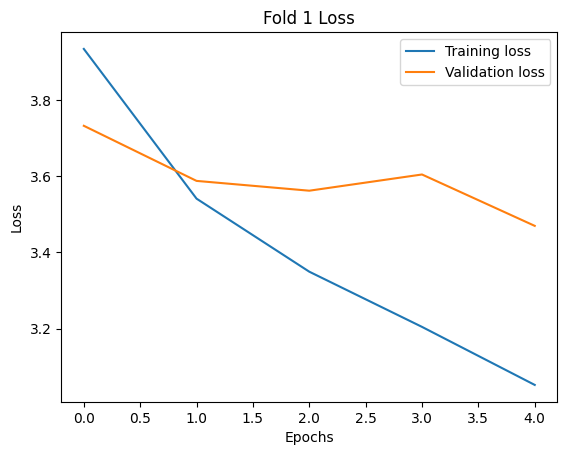

Training fold 2...
Epoch 1/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 393s 246ms/step - loss: 3.1309 - val_loss: 2.7778 - learning_rate: 1.0000e-04
Epoch 2/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 394s 246ms/step - loss: 3.1168 - val_loss: 2.8168 - learning_rate: 1.0000e-04
Epoch 3/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 390s 243ms/step - loss: 3.0583 - val_loss: 2.8173 - learning_rate: 1.0000e-05
Epoch 4/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 393s 245ms/step - loss: 3.0392 - val_loss: 2.7950 - learning_rate: 1.0000e-06
Epoch 5/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 392s 245ms/step - loss: 3.0574 - val_loss: 2.8071 - learning_rate: 1.0000e-06


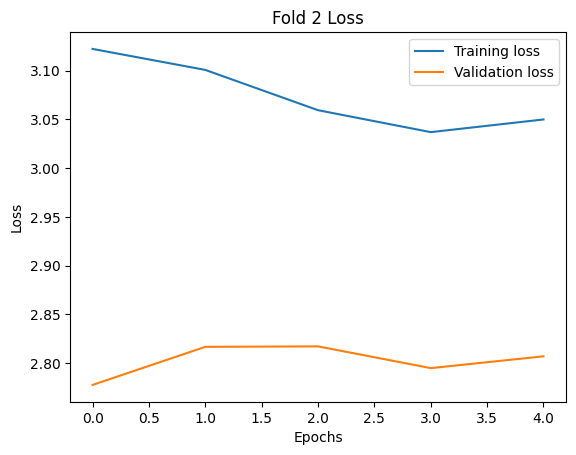

Training fold 3...
Epoch 1/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 396s 248ms/step - loss: 3.0927 - val_loss: 2.6924 - learning_rate: 1.0000e-06
Epoch 2/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 395s 247ms/step - loss: 3.1291 - val_loss: 2.7484 - learning_rate: 1.0000e-06
Epoch 3/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 393s 246ms/step - loss: 3.1088 - val_loss: 2.7281 - learning_rate: 1.0000e-06
Epoch 4/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 394s 246ms/step - loss: 3.0867 - val_loss: 2.6910 - learning_rate: 1.0000e-06
Epoch 5/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 393s 246ms/step - loss: 3.1195 - val_loss: 2.7466 - learning_rate: 1.0000e-06


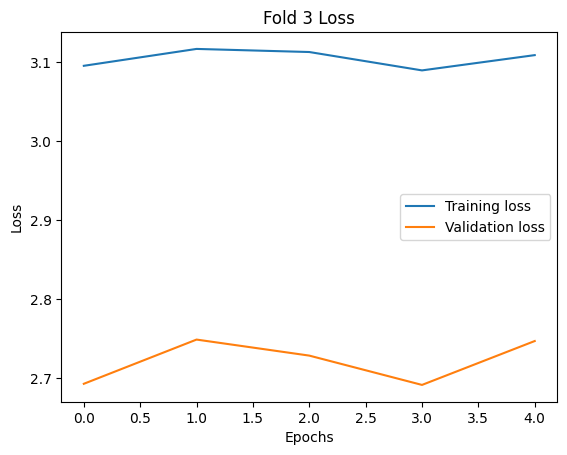

Training fold 4...
Epoch 1/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 472s 295ms/step - loss: 3.0854 - val_loss: 2.6947 - learning_rate: 1.0000e-06
Epoch 2/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 508s 318ms/step - loss: 3.1188 - val_loss: 2.7288 - learning_rate: 1.0000e-06
Epoch 3/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 389s 243ms/step - loss: 3.0827 - val_loss: 2.7483 - learning_rate: 1.0000e-06
Epoch 4/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 387s 242ms/step - loss: 3.0826 - val_loss: 2.6954 - learning_rate: 1.0000e-06
Epoch 5/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 391s 244ms/step - loss: 3.1146 - val_loss: 2.7288 - learning_rate: 1.0000e-06


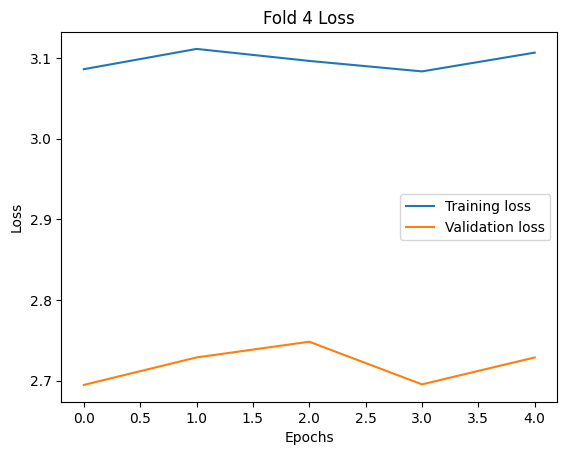

Training fold 5...
Epoch 1/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 390s 244ms/step - loss: 3.0748 - val_loss: 2.7212 - learning_rate: 1.0000e-06
Epoch 2/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 391s 244ms/step - loss: 3.1132 - val_loss: 2.7686 - learning_rate: 1.0000e-06
Epoch 3/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 390s 244ms/step - loss: 3.0931 - val_loss: 2.7517 - learning_rate: 1.0000e-06
Epoch 4/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 388s 243ms/step - loss: 3.0706 - val_loss: 2.7220 - learning_rate: 1.0000e-06
Epoch 5/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 392s 245ms/step - loss: 3.1108 - val_loss: 2.7689 - learning_rate: 1.0000e-06


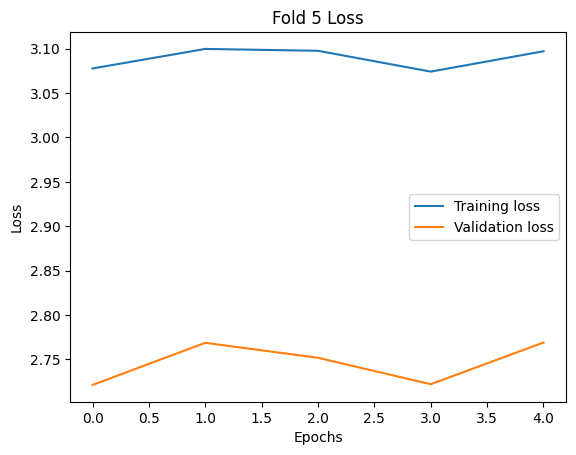

Average Validation Loss: 2.870805788040161


In [91]:
from sklearn.model_selection import KFold
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=1, min_lr=1e-6)
k_folds = 5

kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)
batch_size = 3

epochs = 5

keys = list(train_descriptions.keys())

histories = []

fold_no = 1
for train_index, val_index in kf.split(keys):
    print(f'Training fold {fold_no}...')

    train_keys = [keys[i] for i in train_index]
    val_keys = [keys[i] for i in val_index]

    train_data_fold = {key: encoded_train_data[key] for key in train_keys}
    train_desc_fold = {key: train_descriptions[key] for key in train_keys}
    val_data_fold = {key: encoded_train_data[key] for key in val_keys}
    val_desc_fold = {key: train_descriptions[key] for key in val_keys}

    train_generator = data_generator(train_desc_fold, train_data_fold, word_to_idx, max_len, batch_size, vocab_size)
    val_generator = data_generator(val_desc_fold, val_data_fold, word_to_idx, max_len, batch_size, vocab_size)

    history = model.fit(
        train_generator,
        steps_per_epoch=len(train_keys) // batch_size,
        epochs=epochs,
        validation_data=val_generator,
        validation_steps=len(val_keys) // batch_size,
        callbacks=[early_stopping,reduce_lr]
    )

    histories.append(history)

    plt.plot(history.history['loss'], label='Training loss')
    plt.plot(history.history['val_loss'], label='Validation loss')
    plt.title(f'Fold {fold_no} Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    fold_no += 1

average_val_loss = np.mean([np.min(history.history['val_loss']) for history in histories])
print(f'Average Validation Loss: {average_val_loss}')


### PREDICTIONS

Greedy search

In [42]:
def predict_caption_using_greedySearch(photo):

    inp_text = 'startseq'
    for i in range(max_len):
        sequence = [word_to_idx[word] for word in inp_text.split() if word in word_to_idx]
        sequence = pad_sequences([sequence] , maxlen = max_len , padding = 'post')

        pred_label = model.predict([photo , sequence])
        pred_label = pred_label.argmax()      # Greedy Sampling : Word with max probability always
        pred_word = idx_to_word[pred_label]   # retreiving the word

        inp_text += " " + pred_word    # adding it to the sequence

        # if <e>/end sequence is encountered
        if pred_word == "endseq":
            break

    final_caption = inp_text.split(' ')[1:-1]
    final_caption = ' '.join(final_caption)

    return final_caption

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


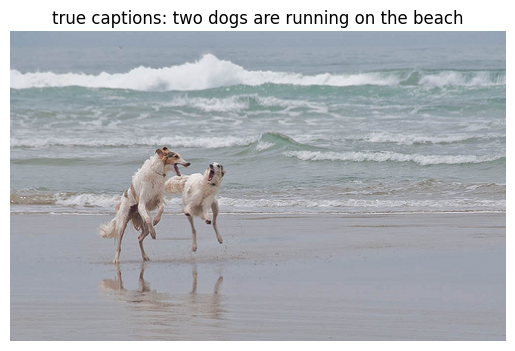

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


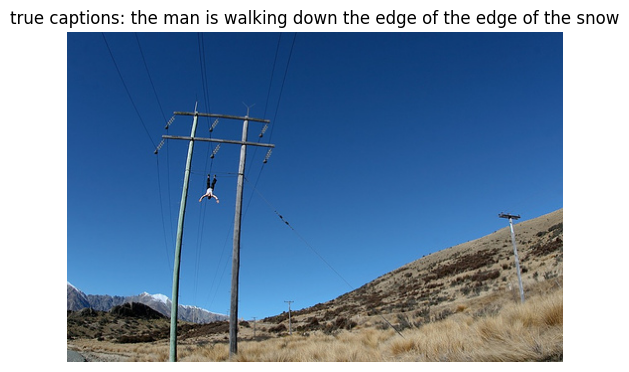

In [46]:
IMG_PATH = 'Flickr_Data/Flickr_Data/Images/'

for i in range(2):
    idx = np.random.randint(0, 1000)

    all_test_images = list(encoded_test_data.keys())
    test_img_id = all_test_images[idx]
    test_img_vec = encoded_test_data[test_img_id].reshape((1, 2048))  # batch size x feature vector

    output_caption = predict_caption_using_greedySearch(test_img_vec)

    img = plt.imread(IMG_PATH + test_img_id )
    plt.imshow(img)
    plt.title("Predicted Caption: " + output_caption)
    plt.title("true captions: " + output_caption)

    plt.axis('off')
    plt.show()

with metrics and true captions

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Byte\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Byte\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

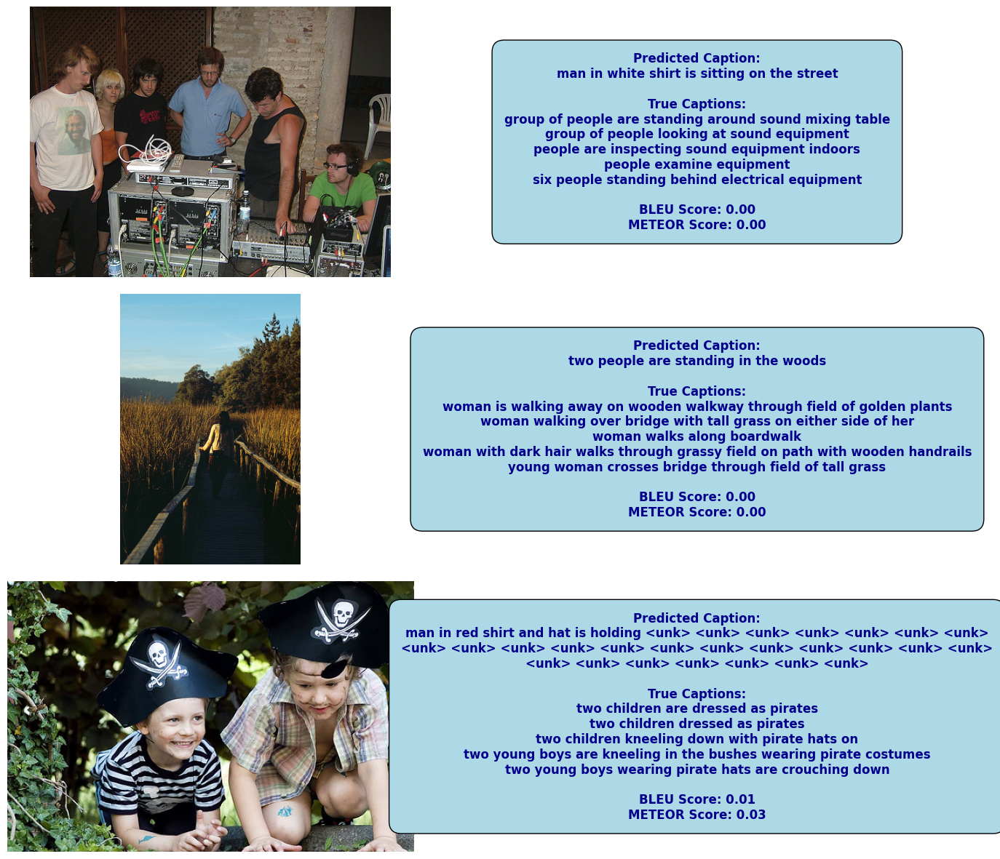

Mid BLEU Score Images:


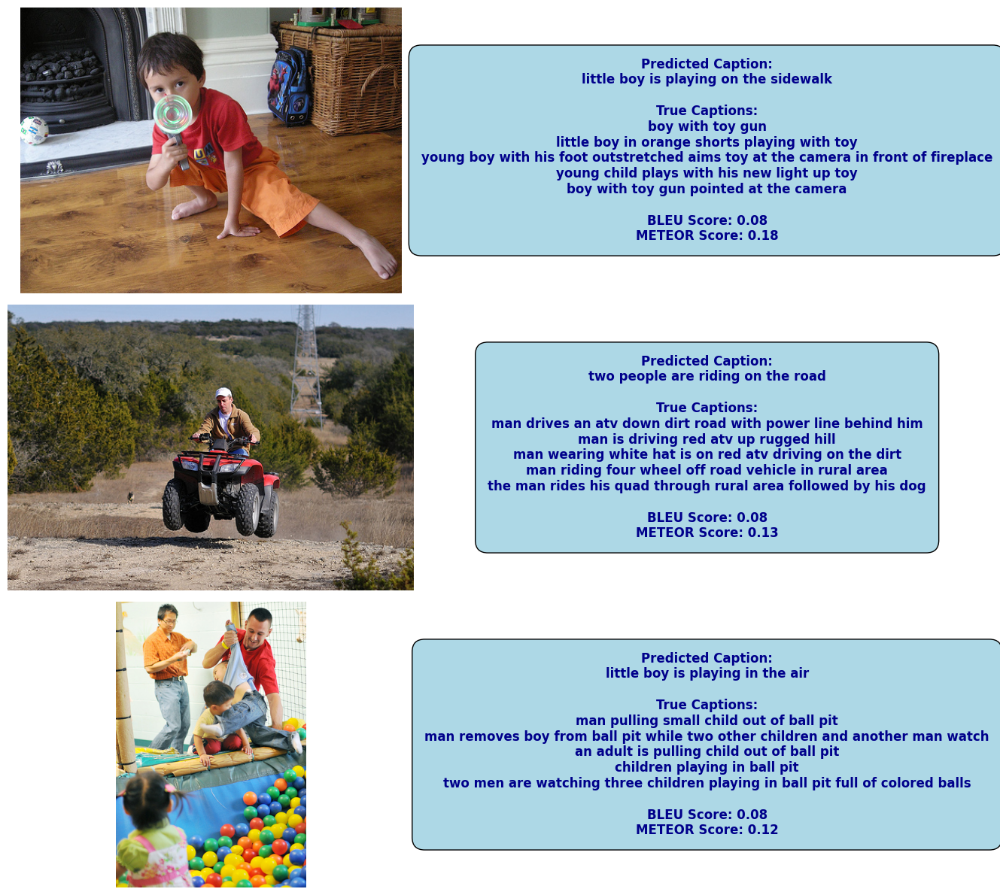

High BLEU Score Images:


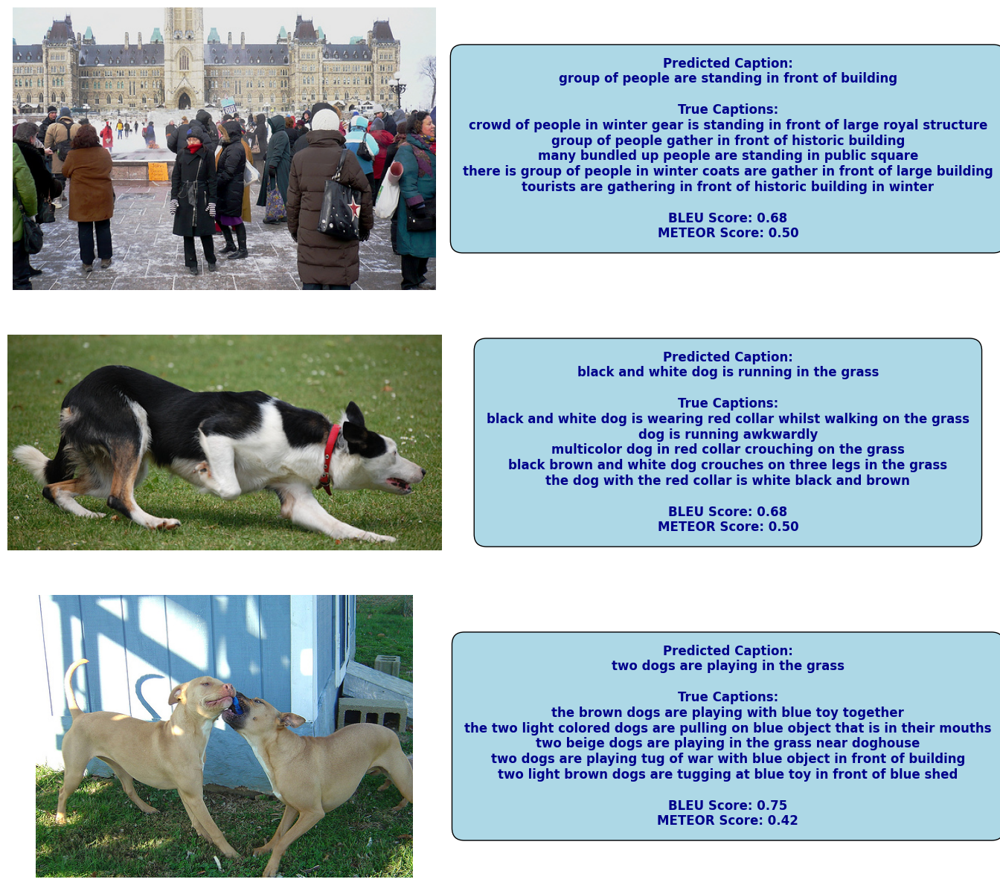

In [47]:
import random
import matplotlib.pyplot as plt
import numpy as np
import nltk
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from nltk.translate.meteor_score import meteor_score
from tensorflow.keras.preprocessing.sequence import pad_sequences

# دانلود منابع مورد نیاز برای METEOR
nltk.download('wordnet')
nltk.download('omw-1.4')

IMG_PATH = 'Flickr_Data/Flickr_Data/Images/'

def predict_caption_using_greedySearch(photo):
    inp_text = 'startseq'
    for i in range(max_len):
        sequence = [word_to_idx.get(word, word_to_idx.get('<unk>', 0)) for word in inp_text.split()]
        sequence = pad_sequences([sequence], maxlen=max_len, padding='post')

        pred_label = model.predict([photo, sequence])
        pred_label = pred_label.argmax()  # Greedy Sampling: Word with max probability always

        pred_word = idx_to_word.get(pred_label, '<unk>')  # استفاده از یک کلمه پیش‌فرض مثل '<unk>' برای برچسب‌های ناشناخته

        inp_text += " " + pred_word


        if pred_word == "endseq":
            break

    final_caption = inp_text.split(' ')[1:-1]
    final_caption = ' '.join(final_caption)

    return final_caption

test_image_ids = list(encoded_test_data.keys())
random.shuffle(test_image_ids)  # درهم کردن لیست تصاویر
test_image_ids = test_image_ids[:300]  # انتخاب 300 تصویر اول

image_scores = []

for test_img_id in test_image_ids:
    test_img_vec = encoded_test_data[test_img_id].reshape((1, 2048))

    output_caption = predict_caption_using_greedySearch(test_img_vec)

    test_img_id1 = test_img_id.replace('.jpg', '')

    true_captions = descriptions[test_img_id1]

    references = [caption.split() for caption in true_captions]

    candidate = output_caption.split()
    smooth = SmoothingFunction().method4
    bleu_score = sentence_bleu(references, candidate, smoothing_function=smooth)

    meteor_scores = [meteor_score([caption], candidate) for caption in references]
    meteor = np.mean(meteor_scores)

    image_scores.append({
        'img_id': test_img_id,
        'output_caption': output_caption,
        'true_captions': true_captions,
        'bleu_score': bleu_score,
        'meteor_score': meteor
    })

sorted_images = sorted(image_scores, key=lambda x: x['bleu_score'])

low_bleu_images = sorted_images[:3]
mid_bleu_images = sorted_images[len(sorted_images)//2-1:len(sorted_images)//2+2]
high_bleu_images = sorted_images[-3:]

def display_images(images):
    fig, axes = plt.subplots(3, 2, figsize=(14, 12))
    for i, data in enumerate(images):
        img = plt.imread(IMG_PATH + data['img_id'])
        axes[i, 0].imshow(img)
        axes[i, 0].axis('off')

        caption_text = (
            f"Predicted Caption:\n{data['output_caption']}\n\n"
            f"True Captions:\n" + "\n".join(data['true_captions']) + "\n\n"
            f"BLEU Score: {data['bleu_score']:.2f}\n"
            f"METEOR Score: {data['meteor_score']:.2f}"
        )
        axes[i, 1].text(
            0.5, 0.5, caption_text, fontsize=12, ha='center', va='center', wrap=True,
            fontname='DejaVu Sans', color='darkblue', fontweight='bold', backgroundcolor='lightgray',
            bbox=dict(facecolor='lightblue', edgecolor='black', boxstyle='round,pad=1')
        )
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

print("Low BLEU Score Images:")
display_images(low_bleu_images)

print("Mid BLEU Score Images:")
display_images(mid_bleu_images)

print("High BLEU Score Images:")
display_images(high_bleu_images)


In [48]:
from nltk.translate.bleu_score import corpus_bleu

def calculate_bleu_scores(references, candidate):
    bleu1 = sentence_bleu(references, candidate, weights=(1.0, 0, 0, 0), smoothing_function=SmoothingFunction().method4)
    bleu2 = sentence_bleu(references, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=SmoothingFunction().method4)
    bleu3 = sentence_bleu(references, candidate, weights=(0.33, 0.33, 0.33, 0), smoothing_function=SmoothingFunction().method4)
    bleu4 = sentence_bleu(references, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=SmoothingFunction().method4)
    return bleu1, bleu2, bleu3, bleu4

bleu1_scores = []
bleu2_scores = []
bleu3_scores = []
bleu4_scores = []
meteor_scores_list = []

for test_img_id in test_image_ids:
    test_img_vec = encoded_test_data[test_img_id].reshape((1, 2048))

    output_caption = predict_caption_using_greedySearch(test_img_vec)

    test_img_id1 = test_img_id.replace('.jpg', '')

    true_captions = descriptions[test_img_id1]

    references = [caption.split() for caption in true_captions]

    candidate = output_caption.split()

    bleu1, bleu2, bleu3, bleu4 = calculate_bleu_scores(references, candidate)

    meteor_scores = [meteor_score([caption], candidate) for caption in references]
    meteor = np.mean(meteor_scores)

    bleu1_scores.append(bleu1)
    bleu2_scores.append(bleu2)
    bleu3_scores.append(bleu3)
    bleu4_scores.append(bleu4)
    meteor_scores_list.append(meteor)

avg_bleu1 = np.mean(bleu1_scores)
avg_bleu2 = np.mean(bleu2_scores)
avg_bleu3 = np.mean(bleu3_scores)
avg_bleu4 = np.mean(bleu4_scores)
avg_meteor = np.mean(meteor_scores_list)

print(f"Average BLEU-1 Score: {avg_bleu1:.2f}")
print(f"Average BLEU-2 Score: {avg_bleu2:.2f}")
print(f"Average BLEU-3 Score: {avg_bleu3:.2f}")
print(f"Average BLEU-4 Score: {avg_bleu4:.2f}")
print(f"Average METEOR Score: {avg_meteor:.2f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

Beam search

In [83]:
def predict_caption_using_beam_search(photo, beam_width=3):
    start_word = 'startseq'
    end_word = 'endseq'
    vocab_size = len(idx_to_word)  # تعداد کل کلمات در دیکشنری

    # Initial beam setup
    sequences = [[list(), 1.0]]

    # Iterate through each step in the caption
    for _ in range(max_len):
        all_candidates = []
        for seq, score in sequences:
            if seq and idx_to_word.get(seq[-1], '<unk>') == end_word:
                # Skip sequences that have ended
                all_candidates.append([seq, score])
                continue

            # Predict next words
            sequence = pad_sequences([seq], maxlen=max_len, padding='post')
            preds = model.predict([photo, sequence])[0]
            top_k = preds.argsort()[-beam_width:][::-1]

            # Generate new candidates
            for word_idx in top_k:
                next_seq = seq + [word_idx]
                prob = score * np.log(preds[word_idx] + 1e-10)  # Avoid log(0)
                all_candidates.append([next_seq, prob])

        # Select the top beam_width candidates
        ordered = sorted(all_candidates, key=lambda tup: tup[1], reverse=True)
        sequences = ordered[:beam_width]

    # Select the best sequence
    best_seq = sequences[0][0]
    final_caption = ' '.join([idx_to_word.get(idx, '<unk>') for idx in best_seq if idx_to_word.get(idx, '<unk>') != start_word and idx_to_word.get(idx, '<unk>') != end_word])

    return final_caption




1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

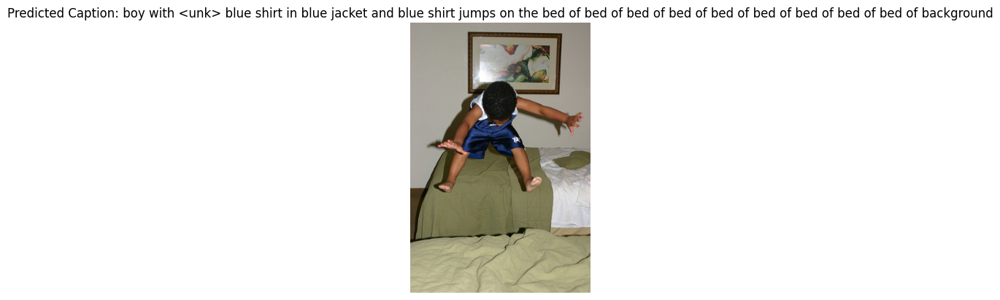

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

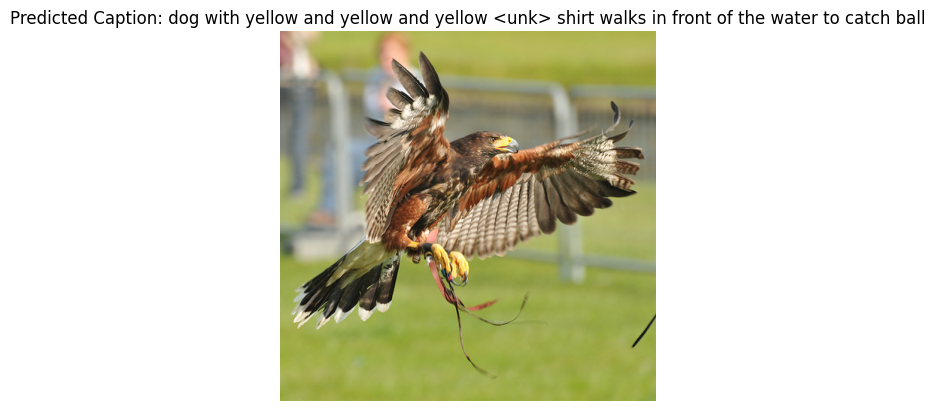

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━

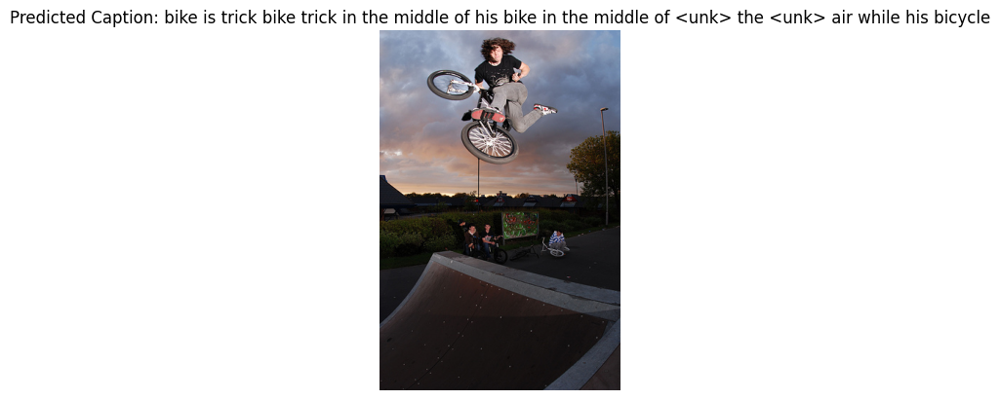

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

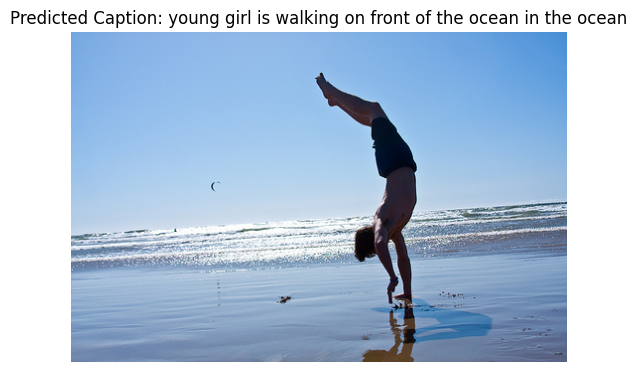

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━

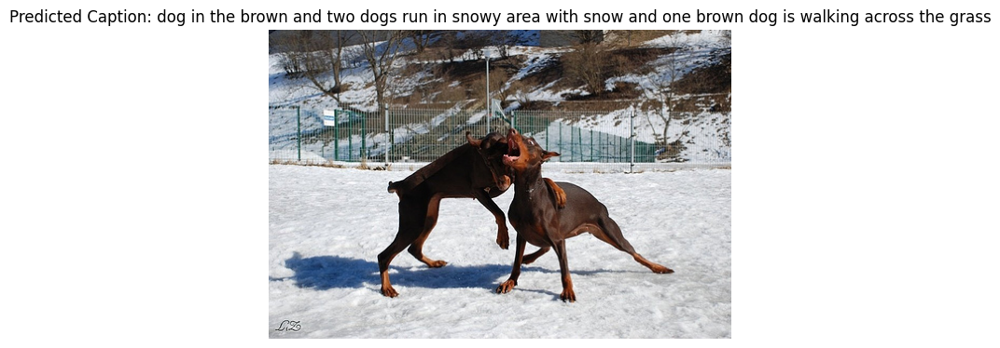

In [84]:
for i in range(5):
    idx = np.random.randint(0, 1000)

    all_test_images = list(encoded_test_data.keys())
    test_img_id = all_test_images[idx]
    test_img_vec = encoded_test_data[test_img_id].reshape((1, 2048))  # batch size x feature vector

    # استفاده از Beam Search به جای Greedy Search
    output_caption = predict_caption_using_beam_search(test_img_vec, beam_width=3)

    img = plt.imread(IMG_PATH + test_img_id)
    plt.imshow(img)
    plt.title("Predicted Caption: " + output_caption)
    plt.axis('off')
    plt.show()



In [82]:
test_image_ids = list(encoded_test_data.keys())
random.shuffle(test_image_ids)
test_image_ids = test_image_ids[:300]

bleu_scores_1 = []
bleu_scores_2 = []
bleu_scores_3 = []
bleu_scores_4 = []
meteor_scores = []

for test_img_id in test_image_ids:
    test_img_vec = encoded_test_data[test_img_id].reshape((1, 2048))
    output_caption = predict_caption_using_beam_search(test_img_vec, beam_width=3)

    if output_caption is None:
        continue

    test_img_id1 = test_img_id.replace('.jpg', '')
    true_captions = descriptions[test_img_id1]
    references = [caption.split() for caption in true_captions]

    candidate = output_caption.split()
    smooth = SmoothingFunction().method4

    bleu_1 = sentence_bleu(references, candidate, weights=(1, 0, 0, 0), smoothing_function=smooth)
    bleu_2 = sentence_bleu(references, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)
    bleu_3 = sentence_bleu(references, candidate, weights=(0.33, 0.33, 0.33, 0), smoothing_function=smooth)
    bleu_4 = sentence_bleu(references, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)

    bleu_scores_1.append(bleu_1)
    bleu_scores_2.append(bleu_2)
    bleu_scores_3.append(bleu_3)
    bleu_scores_4.append(bleu_4)

    meteor = np.mean([meteor_score([caption], " ".join(candidate)) for caption in true_captions])
    meteor_scores.append(meteor)


print(f"Average BLEU-1 Score: {np.mean(bleu_scores_1):.2f}")
print(f"Average BLEU-2 Score: {np.mean(bleu_scores_2):.2f}")
print(f"Average BLEU-3 Score: {np.mean(bleu_scores_3):.2f}")
print(f"Average BLEU-4 Score: {np.mean(bleu_scores_4):.2f}")
print(f"Average METEOR Score: {np.mean(meteor_scores):.2f}")




1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


KeyError: 0